In [1]:
import numpy as np
import pandas as pd
import itertools
from __future__ import division
import geoplotlib as glp
from geoplotlib.utils import BoundingBox, DataAccessObject

%matplotlib inline

In [2]:
filePath = 'datasets/NYPD_Motor_Vehicle_Collisions.csv'

collisions = pd.read_csv(filePath)

In [3]:
collisions = collisions[pd.notnull(collisions.BOROUGH)]
collisions


,DATE,TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,UNIQUE KEY,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
0,03/14/2016,3:27,QUEENS,11372,40.747734,-73.882999,"(40.7477341, -73.8829986)",ROOSEVELT AVENUE,83 STREET,NaN,...,NaN,NaN,NaN,NaN,3405169,OTHER,NaN,NaN,NaN,NaN
3,03/14/2016,0:45,MANHATTAN,10035,40.808279,-73.938793,"(40.8082795, -73.9387929)",EAST 129 STREET,MADISON AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,3405059,PASSENGER VEHICLE,PASSENGER VEHICLE,NaN,NaN,NaN
4,03/13/2016,23:00,BROOKLYN,11206,40.706653,-73.950406,"(40.7066527, -73.9504063)",UNION AVENUE,MONTROSE AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,3405121,PASSENGER VEHICLE,PASSENGER VEHICLE,NaN,NaN,NaN
6,03/13/2016,9:48,BROOKLYN,11212,40.661997,-73.919593,"(40.661997, -73.9195931)",KINGS HIGHWAY,EAST 98 STREET,NaN,...,Unspecified,NaN,NaN,NaN,3404744,PASSENGER VEHICLE,UNKNOWN,NaN,NaN,NaN
9,03/13/2016,9:46,QUEENS,11106,40.756580,-73.929752,"(40.75658, -73.9297516)",36 AVENUE,31 STREET,NaN,...,Unspecified,NaN,NaN,NaN,3404995,LIVERY VEHICLE,PASSENGER VEHICLE,NaN,NaN,NaN
11,03/13/2016,16:00,QUEENS,11413,40.672174,-73.761021,"(40.6721741, -73.7610205)",BEDELL STREET,140 AVENUE,NaN,...,Driver Inattention/Distraction,NaN,NaN,NaN,3404948,PASSENGER VEHICLE,SPORT UTILITY / STATION WAGON,NaN,NaN,NaN
12,03/13/2016,15:20,QUEENS,11105,40.779280,-73.900874,"(40.7792798, -73.9008742)",37 STREET,19 AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,3405001,PASSENGER VEHICLE,UNKNOWN,NaN,NaN,NaN
14,03/13/2016,15:20,MANHATTAN,10019,40.761719,-73.982807,"(40.7617191, -73.9828066)",WEST 51 STREET,7 AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,3404581,PASSENGER VEHICLE,SPORT UTILITY / STATION WAGON,NaN,NaN,NaN
15,03/13/2016,9:15,STATEN ISLAND,10304,40.591737,-74.096676,"(40.5917371, -74.0966763)",ALTER AVENUE,JEFFERSON STREET,NaN,...,Unspecified,NaN,NaN,NaN,3405044,SPORT UTILITY / STATION WAGON,UNKNOWN,NaN,NaN,NaN
18,03/13/2016,15:15,MANHATTAN,10036,40.757828,-73.993070,"(40.7578281, -73.9930696)",9 AVENUE,WEST 41 STREET,NaN,...,Unspecified,NaN,NaN,NaN,3404556,PASSENGER VEHICLE,SPORT UTILITY / STATION WAGON,NaN,NaN,NaN


In [4]:
print "Collisions in all %d" % len(collisions)

Collisions in all 584753


In [5]:
borough = collisions.BOROUGH.unique()
contributions = collisions['CONTRIBUTING FACTOR VEHICLE 1'].unique()
vehicle_types = collisions['VEHICLE TYPE CODE 1'].unique()

In [6]:
collisions.columns

Index([u'DATE', u'TIME', u'BOROUGH', u'ZIP CODE', u'LATITUDE', u'LONGITUDE',
       u'LOCATION', u'ON STREET NAME', u'CROSS STREET NAME',
       u'OFF STREET NAME', u'NUMBER OF PERSONS INJURED',
       u'NUMBER OF PERSONS KILLED', u'NUMBER OF PEDESTRIANS INJURED',
       u'NUMBER OF PEDESTRIANS KILLED', u'NUMBER OF CYCLIST INJURED',
       u'NUMBER OF CYCLIST KILLED', u'NUMBER OF MOTORIST INJURED',
       u'NUMBER OF MOTORIST KILLED', u'CONTRIBUTING FACTOR VEHICLE 1',
       u'CONTRIBUTING FACTOR VEHICLE 2', u'CONTRIBUTING FACTOR VEHICLE 3',
       u'CONTRIBUTING FACTOR VEHICLE 4', u'CONTRIBUTING FACTOR VEHICLE 5',
       u'UNIQUE KEY', u'VEHICLE TYPE CODE 1', u'VEHICLE TYPE CODE 2',
       u'VEHICLE TYPE CODE 3', u'VEHICLE TYPE CODE 4', u'VEHICLE TYPE CODE 5'],
      dtype='object')

In [7]:
injured = collisions['NUMBER OF PEDESTRIANS INJURED'].sum() + \
collisions['NUMBER OF CYCLIST INJURED'].sum() + \
collisions['NUMBER OF MOTORIST INJURED'].sum()

killed = collisions['NUMBER OF PEDESTRIANS KILLED'].sum() + collisions['NUMBER OF CYCLIST KILLED'].sum() + collisions['NUMBER OF MOTORIST KILLED'].sum()

In [8]:
print 'People killed in NYC between 2012 and 2016 marts: %d' % killed
print 'People injured in NYC between 2012 and 2016 marts: %d' % injured

People killed in NYC between 2012 and 2016 marts: 713
People injured in NYC between 2012 and 2016 marts: 146081


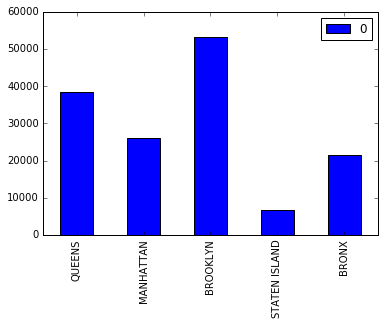

In [9]:
def sumKillings(df):
    return df['NUMBER OF PEDESTRIANS KILLED'].sum() + df['NUMBER OF CYCLIST KILLED'].sum() + df['NUMBER OF MOTORIST KILLED'].sum()

def sumInjuries(df):
    return df['NUMBER OF PEDESTRIANS INJURED'].sum() + df['NUMBER OF CYCLIST INJURED'].sum() + df['NUMBER OF MOTORIST INJURED'].sum()

xs = []
ys = []
for b in collisions['BOROUGH'].unique():
    mask = (collisions.BOROUGH == b)
    col_by_bo = collisions[mask]
    ys.append(sumInjuries(col_by_bo))
    xs.append(b)
df = pd.DataFrame(pd.Series(ys, index=xs))
    
df.plot(kind='bar')

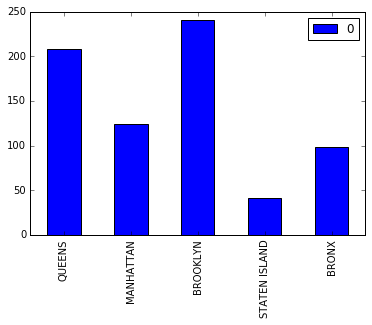

In [10]:
xs = []
ys = []
for b in collisions['BOROUGH'].unique():
    mask = (collisions.BOROUGH == b)
    col_by_bo = collisions[mask]
    ys.append(sumKillings(col_by_bo))
    xs.append(b)
df = pd.DataFrame(pd.Series(ys, index=xs))
    
df.plot(kind='bar')

# What is the cause of deaths?
1. First overall
1. Then per district 

In [11]:

mask_killings = ((collisions['NUMBER OF MOTORIST KILLED'] >= 1) | (collisions['NUMBER OF PEDESTRIANS KILLED'] >= 1) | (collisions['NUMBER OF CYCLIST KILLED'] >= 1))
mask_injuired = ((collisions['NUMBER OF MOTORIST INJURED'] >= 1) | (collisions['NUMBER OF PEDESTRIANS INJURED'] >= 1) | (collisions['NUMBER OF CYCLIST INJURED'] >= 1))

collisions_with_killings = collisions[mask_killings]

collisions_with_injuries = collisions[mask_injuired]

print 'Collisions with killings %d' % len(collisions_with_killings)
print 'Collisions with injuries %d' % len(collisions_with_injuries)

Collisions with killings 688
Collisions with injuries 109552


In [12]:
def filter_cause(cause):
    return collisions[(collisions['CONTRIBUTING FACTOR VEHICLE 1'] == cause) | \
                (collisions['CONTRIBUTING FACTOR VEHICLE 2'] == cause) | \
                (collisions['CONTRIBUTING FACTOR VEHICLE 3'] == cause) | \
                (collisions['CONTRIBUTING FACTOR VEHICLE 4'] == cause) | \
                (collisions['CONTRIBUTING FACTOR VEHICLE 5'] == cause)]

def draw_kde(data):
    bbox = BoundingBox(north=data.LATITUDE.max()-0.055,\
                       west=data.LONGITUDE.min()+0.055,\
                       south=data.LATITUDE.min()-0.055,\
                       east=data.LONGITUDE.max()+0.055)

    #bbox = BoundingBox(north=40.915256, west=-74.255735, south=40.496044, east=-73.700272)

    coords = {'lat': data.LATITUDE.values.tolist(), 'lon': data.LONGITUDE.values.tolist()}
    
    glp.kde(coords, bw=2, cut_below=1e-4)
    glp.set_bbox(bbox)
    glp.inline()



In [13]:
for c in collisions['CONTRIBUTING FACTOR VEHICLE 1'].unique().tolist()[:2]:
    filtered = filter_cause(c)
    print "CAUSE: " + c
    print "COUNT: " + str(len(filtered)) + " of " + str(len(collisions))
    draw_kde(filtered)

CAUSE: Unspecified
COUNT: 488908 of 584753
('smallest non-zero count', 8.955579620337621e-09)
('max count:', 39.043010631210215)


CAUSE: Driver Inattention/Distraction
COUNT: 75698 of 584753
('smallest non-zero count', 4.4777898101688105e-09)
('max count:', 15.206416185919462)


In [14]:

# Draw a heat map of all collisions with killed people
draw_kde(collisions_with_killings)

('smallest non-zero count', 4.4777898101688105e-09)
('max count:', 0.14918840773812889)


In [15]:
draw_kde(collisions_with_injuries)

('smallest non-zero count', 4.4777898101688105e-09)
('max count:', 6.8284101814494713)


In [16]:
draw_kde(collisions_with_killings[collisions_with_killings['NUMBER OF CYCLIST KILLED'] >= 1])

('smallest non-zero count', 4.4777898101688105e-09)
('max count:', 0.11981243389582699)


In [17]:
collisions_with_killings['NUMBER OF CYCLIST KILLED'].sum()
collisions_with_injuries['NUMBER OF CYCLIST INJURED'].sum()

13686

In [18]:
glp.geojson('datasets/police_districts.txt')
glp.inline()

IOError: [Errno 2] No such file or directory: 'datasets/police_districts.txt'

In [ ]:
glp.geojson('datasets/School_Districts.geojson')
glp.inline()

In [ ]:
collisions.head()

years = ['2012', '2013', '2014', '2015']

for year in years:
    coll_by_year = collisions[collisions.DATE.str.contains(year)]
    xs = []
    ys = []
    
    
    for b in coll_by_year['BOROUGH'].unique():
        mask = (coll_by_year.BOROUGH == b)
        col_by_bo = coll_by_year[mask]
        ys.append(sumInjuries(col_by_bo))
        xs.append(b)
    df = pd.DataFrame(pd.Series(ys, index=xs, name=year).sort_values())
    df.plot(kind='bar')
    

In [ ]:
quarters = [
    ('q1', ['01','02','03']),
    ('q2', ['04','05','06']),
    ('q3', ['07','08','09']),
    ('q4', ['10','11','12'])
]

In [ ]:
series = {}

for b in collisions['BOROUGH'].unique():
    xs = []
    ys = []
    boroughs = collisions[(collisions.BOROUGH == b)]
    print b
    for y in years:
        print y
        for (q,m) in quarters:
            col = boroughs[(boroughs.DATE.str.contains(y)) & (boroughs.DATE.str.split('/').str[0].isin(m))]
            ys.append(len(col))
            xs.append(y + ' ' + q)
    series[b] = pd.Series(ys, index=xs, name=b)



In [ ]:
pd.DataFrame(series).plot(kind='bar', subplots=True, layout=(3,2), figsize=(14,14))

In [ ]:
series = {}

for b in collisions['BOROUGH'].unique():
    xs = []
    ys = []
    boroughs = collisions[(collisions.BOROUGH == b)]
    print b
    for y in years:
        print y
        for m in range(1,13):
            month = str(m)
            if (m < 10):
                month = '0' + str(m)
            col = boroughs[(boroughs.DATE.str.contains(y)) & (boroughs.DATE.str.split('/').str[0] == month)]
            ys.append(len(col))
            xs.append(y + ' ' + str(m))
    series[b] = pd.Series(ys, index=xs, name=b)

In [ ]:
pd.DataFrame(series).plot(kind='bar', subplots=True, layout=(5,1), figsize=(14,14))

# Plot vehicle types


In [ ]:
vehicle_types_index = ['VEHICLE TYPE CODE 1','VEHICLE TYPE CODE 2','VEHICLE TYPE CODE 3','VEHICLE TYPE CODE 4','VEHICLE TYPE CODE 5']
vehicle_types = collisions['VEHICLE TYPE CODE 1'].unique()


def countVehicleType(dataset):
    series = None
    for i in vehicle_types_index:
        c = dataset[i].value_counts()
        if series is None:
            series = c
        else:
            for k,v in c.iteritems():
                series[k] += v
    return series


#pd.DataFrame(vehicle_type.value_counts()).plot(kind='bar')
vt_overall = countVehicleType(collisions)
vt_overall.name = 'Vehicle types'
pd.DataFrame(vt_overall).sort_values(by='Vehicle types').plot(kind='bar', figsize=(14,14))

#series

In [ ]:

series = {}

for b in collisions['BOROUGH'].unique():
    series[b] = countVehicleType(collisions[collisions.BOROUGH == b])
    
pd.DataFrame(series).plot(kind='bar', figsize=(12,12), subplots=True)